## 1. Important Libraries

In [63]:
#Importing necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import shutil
import itertools
import imutils
import random
from data_utils import load_data

#sk-learn packages
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report

#plotly packages
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
from plotly import tools

#keras packages
import keras
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16, preprocess_input as vgg_preprocess
from keras import layers
from keras.models import Model, Sequential
from keras.optimizers import Adam, RMSprop
from keras.callbacks import EarlyStopping, ReduceLROnPlateau

#importing ResNet50 model
from keras.applications.resnet50 import ResNet50, preprocess_input as resnet_preprocess
from keras.layers import GlobalAveragePooling2D

#importing inceptionV3 model
from keras.applications.inception_v3 import InceptionV3, preprocess_input as inception_preprocess

#importing efficientnetB0 model
from keras.applications import EfficientNetB0
from keras.applications.efficientnet import preprocess_input as efficientnet_preprocess
#importing mobilenetv3large model
from keras.applications import MobileNetV3Large
from keras.applications.mobilenet_v3 import preprocess_input as mobilenet_preprocess

## 2. Split the data into T/T/V 

In [64]:
dataset_path = r"D:\AI\OpenCV Projects\Brain Tumor Detection\archive\brain_tumor_dataset"
random_state = 42
test_frac = 0.20   # fraction for test
val_frac = 0.10    # fraction for validation (of the full dataset)

# collect files per class
class_files = {}
for cls in os.listdir(dataset_path):
    if cls.startswith('.'):
        continue
    class_dir = os.path.join(dataset_path, cls)
    if not os.path.isdir(class_dir):
        continue
    files = [os.path.join(class_dir, f) for f in os.listdir(class_dir)
             if os.path.isfile(os.path.join(class_dir, f))]
    class_files[cls] = files

# create output dirs: Ensures top-level folders exist even if no files get copied (useful for manual inspection or other code that expects the directories).
for d in ("TRAIN", "VAL", "TEST"): 
    os.makedirs(d, exist_ok=True)

# use stratified global split if every class has at least 3 samples
use_stratify = all(len(files) >= 3 for files in class_files.values())

def copy_to_split(items, split_name):
    for src, cls in items:
        dst_dir = os.path.join(split_name, cls.upper())
        os.makedirs(dst_dir, exist_ok=True)
        shutil.copy(src, os.path.join(dst_dir, os.path.basename(src)))

if use_stratify:
    X, y = [], []
    for cls, files in class_files.items():
        for f in files:
            X.append(f); y.append(cls)
    # split out test
    X_temp, X_test, y_temp, y_test = train_test_split(
        X, y, test_size=test_frac, stratify=y, random_state=random_state
    )
    # split temp into train and val; compute val fraction relative to temp
    val_frac_of_temp = val_frac / (1 - test_frac)
    X_train, X_val, y_train, y_val = train_test_split(
        X_temp, y_temp, test_size=val_frac_of_temp, stratify=y_temp, random_state=random_state
    )
    copy_to_split(zip(X_train, y_train), "TRAIN")
    copy_to_split(zip(X_val, y_val), "VAL")
    copy_to_split(zip(X_test, y_test), "TEST")
else:
    # fallback: per-class shuffle & split (handles tiny classes)
    random.seed(random_state)
    for cls, files in class_files.items():
        random.shuffle(files)
        n = len(files)
        n_test = int(round(test_frac * n))
        n_val = int(round(val_frac * n))
        # ensure at least one for train when possible
        if n - n_test - n_val < 1 and n >= 1:
            # prefer train, then val, then test
            if n_val > 0:
                n_val -= 1
            elif n_test > 0:
                n_test -= 1
        start = 0
        for f in files[:n_test]:
            dst = os.path.join("TEST", cls.upper()); os.makedirs(dst, exist_ok=True)
            shutil.copy(f, os.path.join(dst, os.path.basename(f)))
        for f in files[n_test:n_test + (n - n_test - n_val)]:
            dst = os.path.join("TRAIN", cls.upper()); os.makedirs(dst, exist_ok=True)
            shutil.copy(f, os.path.join(dst, os.path.basename(f)))
        for f in files[n_test + (n - n_test - n_val):]:
            dst = os.path.join("VAL", cls.upper()); os.makedirs(dst, exist_ok=True)
            shutil.copy(f, os.path.join(dst, os.path.basename(f)))

# print summary
def count_split(dirname):
    total = 0
    for root, _, files in os.walk(dirname):
        total += len(files)
    return total

print("TRAIN:", count_split("TRAIN"))
print("VAL:  ", count_split("VAL"))
print("TEST: ", count_split("TEST"))

TRAIN: 176
VAL:   26
TEST:  51


In [65]:
#load the splitted data
train_path = r"D:\AI\OpenCV Projects\Brain Tumor Detection\TRAIN"
val_path = r"D:\AI\OpenCV Projects\Brain Tumor Detection\VAL"
test_path = r"D:\AI\OpenCV Projects\Brain Tumor Detection\TEST"

#check the distribution of image sizes in the train, test and val sets using the scatter plot
def get_image_sizes(path):
    sizes = []
    for root, _, files in os.walk(path):
        for file in files:
            if file.startswith('.'):
                continue
            img_path = os.path.join(root, file)
            img = cv2.imread(img_path)
            if img is not None:
                sizes.append(img.shape[:2])  # (height, width)
    return sizes
train_sizes = get_image_sizes(train_path)
val_sizes = get_image_sizes(val_path)
test_sizes = get_image_sizes(test_path)
def plot_image_size_distribution(sizes, title):
    heights = [size[0] for size in sizes]
    widths = [size[1] for size in sizes]

    fig = go.Figure()
    # Change the two Histogram traces to a single Scatter trace
    fig.add_trace(go.Scatter(x=widths, y=heights, mode='markers',  # This ensures we get points, not lines
        name='Image Dimensions', opacity=0.75))

    # Update the layout titles to be appropriate for a scatter plot
    fig.update_layout(title=title, xaxis_title='Widths (pixels)', yaxis_title='Heights (pixels)')
    iplot(fig)
#call the function to plot image size distributions
plot_image_size_distribution(train_sizes, 'Training Set Image Size Distribution')
plot_image_size_distribution(val_sizes, 'Validation Set Image Size Distribution')
plot_image_size_distribution(test_sizes, 'Test Set Image Size Distribution')

## 3. Preprocess the data

In [66]:
#use the load_data function from data_utils.py
img_size = (224, 224)
train_data, train_labels = load_data(train_path, img_size)
val_data, val_labels = load_data(val_path, img_size)
test_data, test_labels = load_data(test_path, img_size)

# Now, check the shape of the first image in the resulting array
print(train_data[0].shape)
print(test_data[0].shape)
print(val_data[0].shape)

Loaded 176 images from D:\AI\OpenCV Projects\Brain Tumor Detection\TRAIN.
Loaded 26 images from D:\AI\OpenCV Projects\Brain Tumor Detection\VAL.
Loaded 51 images from D:\AI\OpenCV Projects\Brain Tumor Detection\TEST.
(224, 224, 3)
(224, 224, 3)
(224, 224, 3)


## 4. Distribution of classes & Sample Images

In [67]:
#lets plot the distribution of classes using plotly
def plot_class_distribution(labels, title):
    class_counts = {}
    for label in labels:
        if label in class_counts:
            class_counts[label] += 1
        else:
            class_counts[label] = 1

    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    fig = go.Figure(data=[go.Bar(x=classes, y=counts)])
    fig.update_layout(title=title,
                      xaxis_title='Classes',
                      yaxis_title='Number of Samples')
    iplot(fig)

#call the function to plot class distributions
plot_class_distribution(train_labels, 'Training Set Class Distribution')
plot_class_distribution(val_labels, 'Validation Set Class Distribution')
plot_class_distribution(test_labels, 'Test Set Class Distribution')

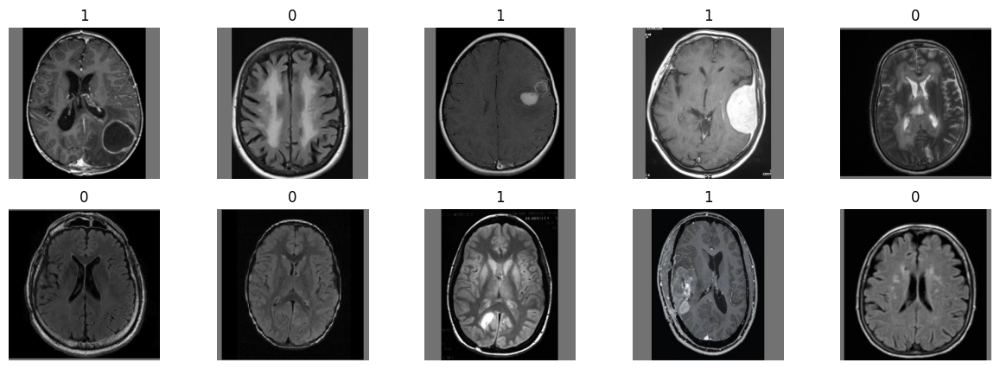

In [68]:
#plot the sample images from the dataset
def plot_sample_images(data, labels, num_samples=10):
    plt.figure(figsize=(15, 5))
    #unique_labels = list(set(labels))
    for i in range(num_samples):
        ax = plt.subplot(2, 5, i + 1) #The core reason for i + 1 is that matplotlib's subplot index starts from 1, while Python's for loop index starts from 0.
        idx = random.randint(0, len(data) - 1)
        plt.imshow(cv2.cvtColor(data[idx], cv2.COLOR_BGR2RGB))
        plt.title(labels[idx])
        plt.axis("off")
    plt.show()
#call the function to plot sample images
plot_sample_images(train_data, train_labels)

## 5. Data Augmentation

Data augmentation is a technique in machine learning used to artificially increase the size and diversity of a training dataset by creating modified versions of existing data.

Instead of collecting new data (which is expensive and time-consuming), I'm gonna apply "transformations" to the current data to teach the model that the core features remain the same even if the appearance changes.

Why It Matters:

    Prevents Overfitting: It stops the model from "memorizing" specific training examples.

    Improves Generalization: It helps the model perform better on new, unseen data by exposing it to more variations.

    Cost-Effective: I get a larger dataset for "free" without manual labeling.

In [69]:
# We would use .flow(x, y) INSTEAD of the .flow_from_directory() code
# 1. Define the generator with augmentation rules
# Note: We do not need a preprocessing_function here if the data is already preprocessed.
# However, VGG16's preprocess_input is more than just scaling, so it's still needed.
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=(0.8, 1.2),
    fill_mode='nearest',
    preprocessing_function=vgg_preprocess # Still apply VGG16 preprocessing
)

# 2. Create the generators from the NumPy arrays in memory
train_generator_from_memory = datagen.flow(
    x=train_data,
    y=train_labels,
    batch_size=32,
    shuffle=True
)

# For validation, we still need a separate generator with no augmentation
validation_datagen_from_memory = ImageDataGenerator(preprocessing_function=vgg_preprocess)

validation_generator_from_memory = validation_datagen_from_memory.flow(
    x=val_data,
    y=val_labels,
    batch_size=32,
    shuffle=False
)

# Create a generator for the test set (no augmentation, no shuffling)
test_generator_from_memory = validation_datagen_from_memory.flow(
    x=test_data,
    y=test_labels,
    batch_size=32,
    shuffle=False
)

## 6. Model Building

### 6.1 VGG16

In [70]:
#load the base models
vgg_base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

#We don't want to ruin the pre-trained weights during the initial training, so its best to "freeze" them.
vgg_base_model.trainable = False

#building the classifier on top of the vgg base model
vgg_model = Sequential([
    keras.Input(shape=(224, 224, 3)),
    vgg_base_model,
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')  # Binary classification
])

#compile the vgg model
vgg_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [71]:
vgg_model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 7, 7, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 256)            │     6,422,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,137,729 (80.63 MB)

 Trainable params: 6,423,041 (24.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

- Total params: 21,137,729: The complete number of parameters in the entire model.
- Trainable params: 6,423,041: This is the most important number for you right now. It's the sum of the parameters from your custom dense and dense_1 layers (6,422,784 + 257). These are the only weights that the optimizer will update during training.
- Non-trainable params: 14,714,688: These are the parameters from the frozen VGG16 base. They are "locked" and will not be changed.

In [72]:
# Print all layers in the VGG base model to find out the last layer name for Grad-CAM
for layer in vgg_base_model.layers:
    print(layer.name)

input_layer_218
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool
block5_conv1
block5_conv2
block5_conv3
block5_pool


### 6.1 Model Training

In [73]:
#build a callback for early stopping
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=4,
    restore_best_weights=True
)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6, verbose=1)

#train the model
history = vgg_model.fit(
    train_generator_from_memory,
    validation_data=validation_generator_from_memory,
    epochs=100,
    verbose=1,
    callbacks=[early_stopping]
)

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 24s 4s/step - accuracy: 0.5909 - loss: 4.5571 - val_accuracy: 0.7308 - val_loss: 3.0562
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - accuracy: 0.6080 - loss: 4.4101 - val_accuracy: 0.9231 - val_loss: 1.2561
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 4s/step - accuracy: 0.7955 - loss: 1.4517 - val_accuracy: 0.9231 - val_loss: 1.2642
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - accuracy: 0.7273 - loss: 2.5867 - val_accuracy: 0.8846 - val_loss: 1.6127
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - accuracy: 0.8239 - loss: 1.8382 - val_accuracy: 0.8846 - val_loss: 1.4707
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 19s 3s/step - accuracy: 0.8409 - loss: 1.6275 - val_accuracy: 0.8846 - val_loss: 1.4895


### 6.2.2 Plotting

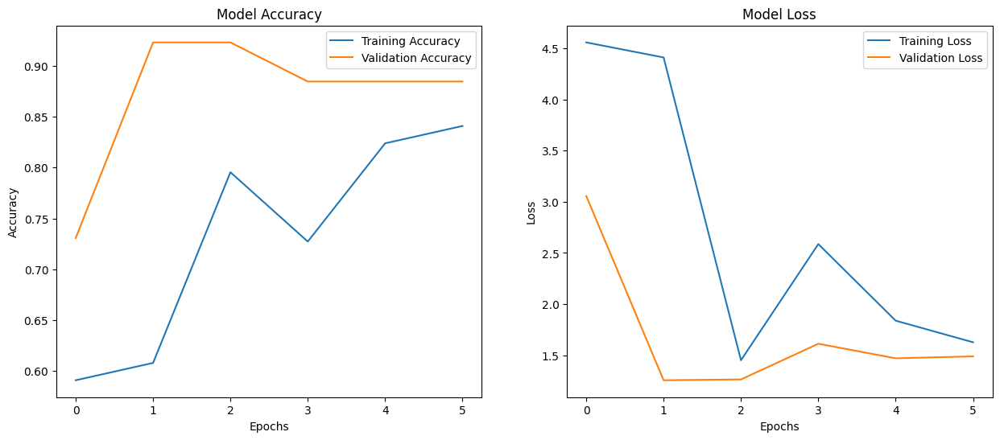

In [74]:
#plot the model performance
def plot_model_performance(history):
    #plot training accuracy and validation values
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    #plot training loss and validation values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

#call the function to plot model performance
plot_model_performance(history)

### 6.2.3 Evaluation

In [75]:
#evaluate the model on the test set
test_loss, test_accuracy = vgg_model.evaluate(test_generator_from_memory)
print(f"Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.4f}")

2/2 ━━━━━━━━━━━━━━━━━━━━ 4s 2s/step - accuracy: 0.7647 - loss: 1.3233
Test Loss: 1.3233, Test Accuracy: 0.7647


### 6.2.4 Prediction & Confusion Matric 

In [76]:
# Get the model's predictions on the test set
predictions = vgg_model.predict(test_generator_from_memory)
predicted_classes = (predictions > 0.5).astype(int) # Convert probabilities to 0 or 1
true_classes = test_generator_from_memory.y

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(true_classes, predicted_classes))

cm = confusion_matrix(true_classes, predicted_classes)

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step
Confusion Matrix:
[[14  6]
 [ 6 25]]


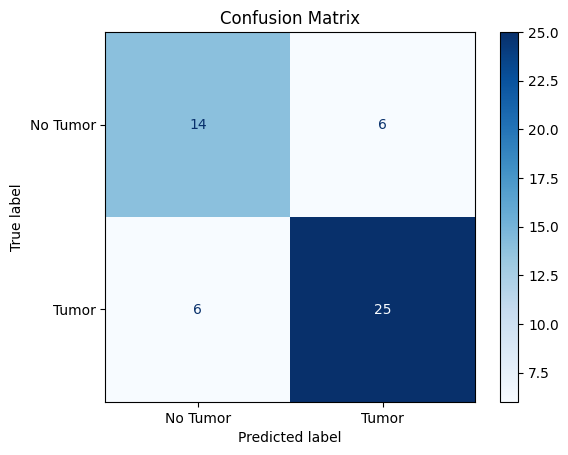

In [77]:
#plot the confusion matrix
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Tumor', 'Tumor']).plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

In [78]:
#classification report
report = classification_report(true_classes, predicted_classes, target_names=['No Tumor', 'Tumor'])
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

    No Tumor       0.70      0.70      0.70        20
       Tumor       0.81      0.81      0.81        31

    accuracy                           0.76        51
   macro avg       0.75      0.75      0.75        51
weighted avg       0.76      0.76      0.76        51



### 6.2.5 Save the trained Model

In [79]:
# #save the model
# import keras
# keras.saving.save_model(vgg_model, 'VGG16_brain_tumor_detection_model.keras')

### 6.3 RestNet Model

In [80]:
resnet_base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
resnet_base_model.trainable = False

#building the classifier on top of the resnet base model
resnet_model = Sequential([
    resnet_base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')  # Binary classification
])

In [81]:
resnet_model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,112,513 (91.98 MB)

 Trainable params: 524,801 (2.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [82]:
#compile the resnet model
resnet_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history = resnet_model.fit(
    train_generator_from_memory,
    #steps_per_epoch=len(X_train) // 32, #32 is the batch size
    epochs=100,
    validation_data=validation_generator_from_memory,
    callbacks=[early_stopping]
)

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 17s 2s/step - accuracy: 0.5341 - loss: 0.9293 - val_accuracy: 0.6154 - val_loss: 0.7208
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6250 - loss: 0.7168 - val_accuracy: 0.7308 - val_loss: 0.5885
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.6136 - loss: 0.6396 - val_accuracy: 0.7692 - val_loss: 0.5391
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 1s/step - accuracy: 0.6761 - loss: 0.5808 - val_accuracy: 0.7692 - val_loss: 0.4831
Epoch 5/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 9s 1s/step - accuracy: 0.7330 - loss: 0.5139 - val_accuracy: 0.7692 - val_loss: 0.4544
Epoch 6/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - accuracy: 0.7330 - loss: 0.4679 - val_accuracy: 0.7308 - val_loss: 0.4176
Epoch 7/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.7330 - loss: 0.4974 - val_accuracy: 0.8462 - val_loss: 0.3935
Epoch 8/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.7955 - loss: 0.4267 - val_accuracy: 0.8077 - val_loss: 0.3766
Epoc

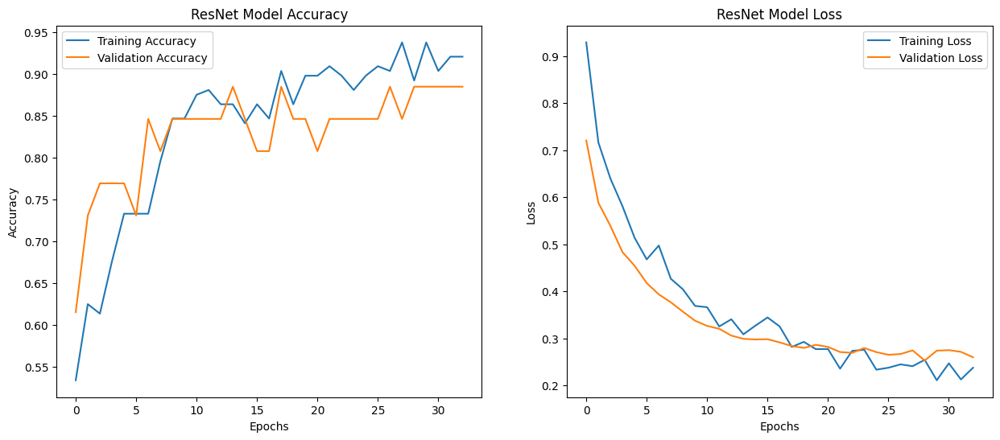

In [83]:
#plot the model performance
def plot_model_performance(history):
    #plot training accuracy and validation values
    plt.figure(figsize=(15,6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('ResNet Model Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    #plot training loss and validation values
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('ResNet Model Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

#call the function to plot model performance
plot_model_performance(history)

In [84]:
# Evaluation of resnet model
print("\nEvaluating on Test Set...")
loss, accuracy = resnet_model.evaluate(test_generator_from_memory)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")


Evaluating on Test Set...
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 727ms/step - accuracy: 0.8824 - loss: 0.2539
Test Loss: 0.2539
Test Accuracy: 0.8824


In [85]:
# Get the model's predictions on the test set
predictions = resnet_model.predict(test_generator_from_memory)
predicted_classes = (predictions > 0.5).astype(int) # Convert probabilities to 0 or 1
true_classes = test_generator_from_memory.y

# Print the confusion matrix
print("Confusion Matrix:")
print(confusion_matrix(true_classes, predicted_classes))

cm = confusion_matrix(true_classes, predicted_classes)

#classification report
report = classification_report(true_classes, predicted_classes, target_names=['No Tumor', 'Tumor'])
print(f"Classification Report:\n{report}")

#save the model
# import keras
# keras.saving.save_model(resnet_model, 'ResNet50_brain_tumor_detection_model.keras')
# print("ResNet50 model saved successfully.")

1/2 ━━━━━━━━━━━━━━━━━━━━ 2s 3s/stepWARNING:tensorflow:5 out of the last 108 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000001B54293F640> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step
Confusion Matrix:
[[16  4]
 [ 2 29]]
Classification Report:
              precision    recall  f1-score   support

    No Tumor       0.89      0.80      0.84        20
       Tumor       0.88      0.9

In [86]:
# Print all layers in the ResNet50 base model to find out the last layer name for Grad-CAM
for layer in resnet_base_model.layers:
    print(layer.name)

input_layer_220
conv1_pad
conv1_conv
conv1_bn
conv1_relu
pool1_pad
pool1_pool
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_0_bn
conv2_block1_3_bn
conv2_block1_add
conv2_block1_out
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_3_bn
conv2_block2_add
conv2_block2_out
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
conv2_block3_3_conv
conv2_block3_3_bn
conv2_block3_add
conv2_block3_out
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_0_bn
conv3_block1_3_bn
conv3_block1_add
conv3_block1_out
conv3_block2_1_conv
conv3_block2_1_bn
conv3_block2_1_relu
conv3_block2_2_conv
conv3_block2_2_b

### 6.4 Inception Model

- We know that the inception model takes input images of size 299*299 so we'll change the dimensions of our dataset.

In [87]:
#use the load_data function from data_utils.py
img_size = (299, 299)
inc_train_data, inc_train_labels = load_data(train_path, img_size)
inc_val_data, inc_val_labels = load_data(val_path, img_size)
inc_test_data, inc_test_labels = load_data(test_path, img_size)

# Now, check the shape of the first image in the resulting array
print(inc_train_data[0].shape)
print(inc_test_data[0].shape)
print(inc_val_data[0].shape)

Loaded 176 images from D:\AI\OpenCV Projects\Brain Tumor Detection\TRAIN.
Loaded 26 images from D:\AI\OpenCV Projects\Brain Tumor Detection\VAL.
Loaded 51 images from D:\AI\OpenCV Projects\Brain Tumor Detection\TEST.
(299, 299, 3)
(299, 299, 3)
(299, 299, 3)


In [88]:
# 1. Define the generator with augmentation rules
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    brightness_range=(0.8, 1.2),
    fill_mode='nearest',
    preprocessing_function=inception_preprocess
)

# 2. Create the generators from the NumPy arrays in memory
inc_train_generator_from_memory = datagen.flow(
    x=inc_train_data,
    y=inc_train_labels,
    batch_size=32,
    shuffle=True
)

# For validation, you still need a separate generator with no augmentation
inc_validation_datagen_from_memory = ImageDataGenerator(preprocessing_function=inception_preprocess)

inc_validation_generator_from_memory = inc_validation_datagen_from_memory.flow(
    x=inc_val_data,
    y=inc_val_labels,
    batch_size=32,
    shuffle=False
)

# Create a generator for the test set (no augmentation, no shuffling)
inc_test_generator_from_memory = inc_validation_datagen_from_memory.flow(
    x=inc_test_data,
    y=inc_test_labels,
    batch_size=32,
    shuffle=False
)

In [89]:
inception_base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
inception_base_model.trainable = True

#building the classifier on top of the inception base model
inception_model = Sequential([
    inception_base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')  # Binary classification
])

inception_model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ inception_v3 (Functional)       │ (None, 8, 8, 2048)     │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_5      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,327,585 (85.17 MB)

 Trainable params: 22,293,153 (85.04 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [90]:
# Print all layers in the inception base model to find out the last layer name for Grad-CAM
for layer in inception_base_model.layers:
    print(layer.name)

input_layer_222
conv2d_94
batch_normalization_94
activation_114
conv2d_95
batch_normalization_95
activation_115
conv2d_96
batch_normalization_96
activation_116
max_pooling2d_4
conv2d_97
batch_normalization_97
activation_117
conv2d_98
batch_normalization_98
activation_118
max_pooling2d_5
conv2d_102
batch_normalization_102
activation_122
conv2d_100
conv2d_103
batch_normalization_100
batch_normalization_103
activation_120
activation_123
average_pooling2d_9
conv2d_99
conv2d_101
conv2d_104
conv2d_105
batch_normalization_99
batch_normalization_101
batch_normalization_104
batch_normalization_105
activation_119
activation_121
activation_124
activation_125
mixed0
conv2d_109
batch_normalization_109
activation_129
conv2d_107
conv2d_110
batch_normalization_107
batch_normalization_110
activation_127
activation_130
average_pooling2d_10
conv2d_106
conv2d_108
conv2d_111
conv2d_112
batch_normalization_106
batch_normalization_108
batch_normalization_111
batch_normalization_112
activation_126
activation_

In [91]:
#compile the inception model
inception_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history = inception_model.fit(
    inc_train_generator_from_memory,
    epochs=100,
    validation_data=inc_validation_generator_from_memory,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 85s 8s/step - accuracy: 0.6761 - loss: 0.6512 - val_accuracy: 0.6538 - val_loss: 0.5205 - learning_rate: 1.0000e-04
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 41s 7s/step - accuracy: 0.8693 - loss: 0.3597 - val_accuracy: 0.8077 - val_loss: 0.3815 - learning_rate: 1.0000e-04
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 40s 7s/step - accuracy: 0.9261 - loss: 0.2293 - val_accuracy: 0.8077 - val_loss: 0.3302 - learning_rate: 1.0000e-04
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 41s 7s/step - accuracy: 0.9659 - loss: 0.1452 - val_accuracy: 0.8462 - val_loss: 0.2661 - learning_rate: 1.0000e-04


In [92]:
# Evaluation of inception model
print("\nEvaluating on Test Set...")
loss, accuracy = inception_model.evaluate(inc_test_generator_from_memory)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")


Evaluating on Test Set...
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 905ms/step - accuracy: 0.7451 - loss: 0.4980
Test Loss: 0.4980
Test Accuracy: 0.7451


> We shall not save this inception model as it didn't yield the best results. I tried with the fixed parameters of the inception and then tried with trainable parameters in case the accuracy might improve. The accuracy improved & the loss reduced, but not drastically.

### 6.5 EfficientNetB0 Model

In [93]:
eff_base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
eff_base_model.trainable = True

#building the classifier on top of the efficientnet base model
eff_model = Sequential([
    eff_base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')  # Binary classification
])

eff_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_6      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,377,764 (16.70 MB)

 Trainable params: 4,335,741 (16.54 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [94]:
# Print all layers in the eff base model to find out the last layer name for Grad-CAM
for layer in eff_base_model.layers:
    print(layer.name)

input_layer_224
rescaling_3
normalization_1
rescaling_4
stem_conv_pad
stem_conv
stem_bn
stem_activation
block1a_dwconv
block1a_bn
block1a_activation
block1a_se_squeeze
block1a_se_reshape
block1a_se_reduce
block1a_se_expand
block1a_se_excite
block1a_project_conv
block1a_project_bn
block2a_expand_conv
block2a_expand_bn
block2a_expand_activation
block2a_dwconv_pad
block2a_dwconv
block2a_bn
block2a_activation
block2a_se_squeeze
block2a_se_reshape
block2a_se_reduce
block2a_se_expand
block2a_se_excite
block2a_project_conv
block2a_project_bn
block2b_expand_conv
block2b_expand_bn
block2b_expand_activation
block2b_dwconv
block2b_bn
block2b_activation
block2b_se_squeeze
block2b_se_reshape
block2b_se_reduce
block2b_se_expand
block2b_se_excite
block2b_project_conv
block2b_project_bn
block2b_drop
block2b_add
block3a_expand_conv
block3a_expand_bn
block3a_expand_activation
block3a_dwconv_pad
block3a_dwconv
block3a_bn
block3a_activation
block3a_se_squeeze
block3a_se_reshape
block3a_se_reduce
block3a_s

In [95]:
#compile the efficientnet model
eff_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history = eff_model.fit(
    train_generator_from_memory,
    epochs=100,
    validation_data=validation_generator_from_memory,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 63s 4s/step - accuracy: 0.4261 - loss: 0.7549 - val_accuracy: 0.2692 - val_loss: 0.8380 - learning_rate: 1.0000e-04
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - accuracy: 0.6818 - loss: 0.6132 - val_accuracy: 0.3846 - val_loss: 0.7780 - learning_rate: 1.0000e-04
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7137 - loss: 0.5511
Epoch 3: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - accuracy: 0.7159 - loss: 0.5471 - val_accuracy: 0.5000 - val_loss: 0.7646 - learning_rate: 1.0000e-04
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 20s 3s/step - accuracy: 0.8182 - loss: 0.4861 - val_accuracy: 0.5000 - val_loss: 0.7438 - learning_rate: 2.0000e-05


In [96]:
# Evaluation of efficient model
print("\nEvaluating on Test Set...")
loss, accuracy = eff_model.evaluate(test_generator_from_memory)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")


Evaluating on Test Set...
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 364ms/step - accuracy: 0.4314 - loss: 0.7751
Test Loss: 0.7751
Test Accuracy: 0.4314


- This efficientB0 model also didn't yield any good accuracy.

### 6.6 MobileNetV3 Large Model

In [97]:
mbl_base_model = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
mbl_base_model.trainable = False

#building the classifier on top of the mobilenet base model
mbl_model = Sequential([
    mbl_base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')  # Binary classification
])

mbl_model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ MobileNetV3Large (Functional)   │ (None, 7, 7, 960)      │     2,996,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_7      │ (None, 960)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 256)            │       246,016 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,242,625 (12.37 MB)

 Trainable params: 246,273 (962.00 KB)

 Non-trainable params: 2,996,352 (11.43 MB)

In [98]:
# Print all layers in the mobile base model to find out the last layer name for Grad-CAM
for layer in mbl_base_model.layers:
    print(layer.name)

input_layer_226
rescaling_5
conv
conv_bn
activation_208
expanded_conv_depthwise
expanded_conv_depthwise_bn
re_lu_19
expanded_conv_project
expanded_conv_project_bn
expanded_conv_add
expanded_conv_1_expand
expanded_conv_1_expand_bn
re_lu_20
expanded_conv_1_depthwise_pad
expanded_conv_1_depthwise
expanded_conv_1_depthwise_bn
re_lu_21
expanded_conv_1_project
expanded_conv_1_project_bn
expanded_conv_2_expand
expanded_conv_2_expand_bn
re_lu_22
expanded_conv_2_depthwise
expanded_conv_2_depthwise_bn
re_lu_23
expanded_conv_2_project
expanded_conv_2_project_bn
expanded_conv_2_add
expanded_conv_3_expand
expanded_conv_3_expand_bn
re_lu_24
expanded_conv_3_depthwise_pad
expanded_conv_3_depthwise
expanded_conv_3_depthwise_bn
re_lu_25
expanded_conv_3_squeeze_excite_avg_pool
expanded_conv_3_squeeze_excite_conv
expanded_conv_3_squeeze_excite_relu
expanded_conv_3_squeeze_excite_conv_1
re_lu_26
expanded_conv_3_squeeze_excite_mul
expanded_conv_3_project
expanded_conv_3_project_bn
expanded_conv_4_expand
exp

In [99]:
#compile the mbl model
mbl_model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

history = mbl_model.fit(
    train_generator_from_memory,
    epochs=100,
    validation_data=validation_generator_from_memory,
    callbacks=[early_stopping, reduce_lr]
)

Epoch 1/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 12s 920ms/step - accuracy: 0.4773 - loss: 0.9284 - val_accuracy: 0.5385 - val_loss: 0.7059 - learning_rate: 1.0000e-04
Epoch 2/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 577ms/step - accuracy: 0.6250 - loss: 0.7415 - val_accuracy: 0.5769 - val_loss: 0.6598 - learning_rate: 1.0000e-04
Epoch 3/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 523ms/step - accuracy: 0.6652 - loss: 0.7032
Epoch 3: ReduceLROnPlateau reducing learning rate to 1.9999999494757503e-05.
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 588ms/step - accuracy: 0.6477 - loss: 0.7139 - val_accuracy: 0.5769 - val_loss: 0.6218 - learning_rate: 1.0000e-04
Epoch 4/100
6/6 ━━━━━━━━━━━━━━━━━━━━ 4s 587ms/step - accuracy: 0.6307 - loss: 0.7195 - val_accuracy: 0.6538 - val_loss: 0.6093 - learning_rate: 2.0000e-05


In [100]:
# Evaluation of efficient model
print("\nEvaluating on Test Set...")
loss, accuracy = mbl_model.evaluate(test_generator_from_memory)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")


Evaluating on Test Set...
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 260ms/step - accuracy: 0.6275 - loss: 0.6321
Test Loss: 0.6321
Test Accuracy: 0.6275


## Grad-CAM Technique

   Grad-CAM (Gradient-weighted Class Activation Mapping) is the "X-ray vision" of Deep Learning. It is an Explainable AI (XAI) technique that tells you exactly which pixels in an image caused the model to make its decision.
   
How it Works: The "Spotlight" Logic

- Grad-CAM works by looking at the gradients (the flow of information) in the last convolutional layer of your network.

- Forward Pass: You put an image into the model (e.g., a "Cat").

- Pick a Class: You tell the model, "Show me why you think this is a Cat."

- Backpropagation: The model looks at the final score for "Cat" and sends a signal backward to find which "feature maps" in the last layer were most excited by that specific class.

- Weighting: Each feature map is given a weight based on how much it contributed to the final "Cat" score.

- Heatmap Generation: These weighted maps are combined into a single 2D heatmap. We use a ReLU function to throw away any negative values (pixels that say "this is NOT a cat") so we only see the positive evidence.

In [101]:
import math
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # 1. Get the base model (VGG16) which is the first layer of your Sequential model
    base_model = model.layers[0]
    
    # 2. Create a sub-model that outputs the last conv layer AND the base model output
    #    We use the base model's inputs to define this sub-model.
    base_model_out = keras.models.Model(
        inputs=base_model.inputs,
        outputs=[base_model.get_layer(last_conv_layer_name).output, base_model.output]
    )
    
    # 3. Reconstruct the full model graph using the Functional API
    #    This ensures a connected graph from input to both outputs.
    
    # Define a new input tensor matching the image shape
    inputs = keras.Input(shape=img_array.shape[1:]) 
    
    # Pass input through the base sub-model to get conv output and features
    conv_output, x = base_model_out(inputs)
    
    # Pass the features (x) through the rest of the Sequential model's layers
    # We skip layer 0 (base_model) and start from layer 1 (Flatten, Dense, etc.)
    for layer in model.layers[1:]:
        x = layer(x)
        
    # Create the final model for Grad-CAM
    grad_model = keras.models.Model(inputs=inputs, outputs=[conv_output, x])

    # 4. Compute gradients
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            score = preds[0][0]
            # For binary classification:
            # If score < 0.5 (No Tumor), visualize evidence for 'No Tumor' (1 - score)
            if score < 0.5:
                class_channel = 1 - score
            else:
                class_channel = score
        else:
             class_channel = preds[0][0]

    # Compute the gradient of the class score with respect to the feature map
    grads = tape.gradient(class_channel, last_conv_layer_output)
    
    # Vector of weights: mean intensity of the gradient over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    # Multiply each channel in the feature map array by "how important this channel is"
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # Normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def get_gradcam_image(img, heatmap, alpha=0.4):
    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = plt.cm.jet

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)
    return superimposed_img

Visualizing Grad-CAM for all 51 test images...


C:\Users\Infinity\AppData\Local\Temp\ipykernel_15876\3984415613.py:61: RuntimeWarning:

invalid value encountered in cast



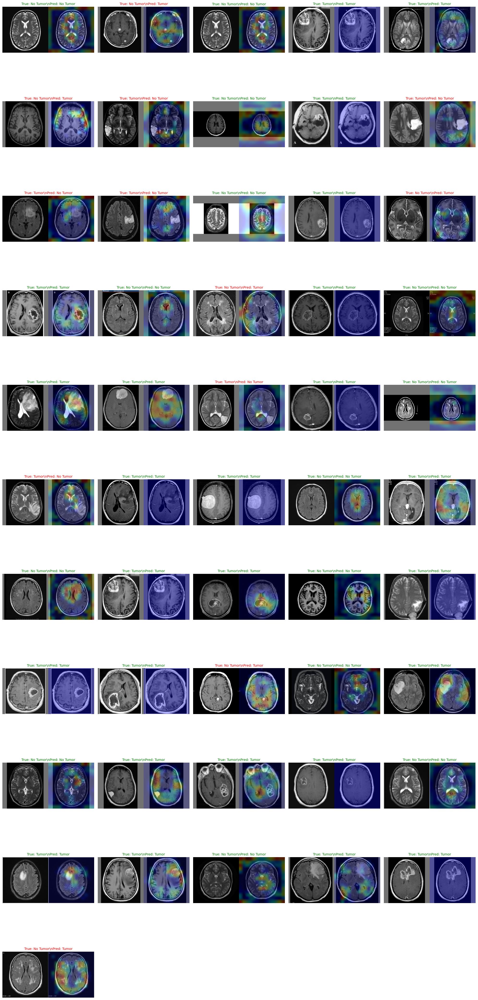

In [106]:
# Run a loop for vgg_model to display all the images and their predicted label.
if 'vgg_model' in locals() and 'test_data' in locals():
    num_images = len(test_data)
    cols = 5
    rows = math.ceil(num_images / cols)
    
    plt.figure(figsize=(20, 4 * rows))
    print(f"Visualizing Grad-CAM for all {num_images} test images...")
    
    for i in range(num_images):
        # Get raw image (BGR format from cv2)
        raw_img = test_data[i]
        
        # Preprocess for model
        img_for_model = raw_img.copy()
        img_for_model = np.expand_dims(img_for_model, axis=0)
        img_for_model = vgg_preprocess(img_for_model)
        
        # Generate heatmap
        heatmap = make_gradcam_heatmap(img_for_model, vgg_model, 'block5_conv3')
        
        # Prepare image for display (Convert BGR to RGB)
        disp_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
        
        # Get superimposed image
        result_img_pil = get_gradcam_image(disp_img, heatmap)
        result_img = np.array(result_img_pil)
        
        # Concatenate original image and Grad-CAM image horizontally
        combined_img = np.hstack((disp_img, result_img))
        
        # Plot
        ax = plt.subplot(rows, cols, i + 1)
        plt.imshow(combined_img)
        
        # Get prediction for title
        preds = vgg_model.predict(img_for_model, verbose=0)
        pred_label = 'Tumor' if preds[0][0] > 0.5 else 'No Tumor'
        true_label = 'Tumor' if test_labels[i] == 1 else 'No Tumor'
        
        # Color title based on correctness
        title_color = 'green' if pred_label == true_label else 'red'
        
        plt.title(f"True: {true_label}\\nPred: {pred_label}", color=title_color, fontsize=10)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("Please train the VGG16 model (vgg_model) and load data (test_data) first.")


> The red/yellow areas in the resulting heatmap will indicate the regions that the model considers most important for identifying the tumor.

Visualizing Grad-CAM for all 51 test images...


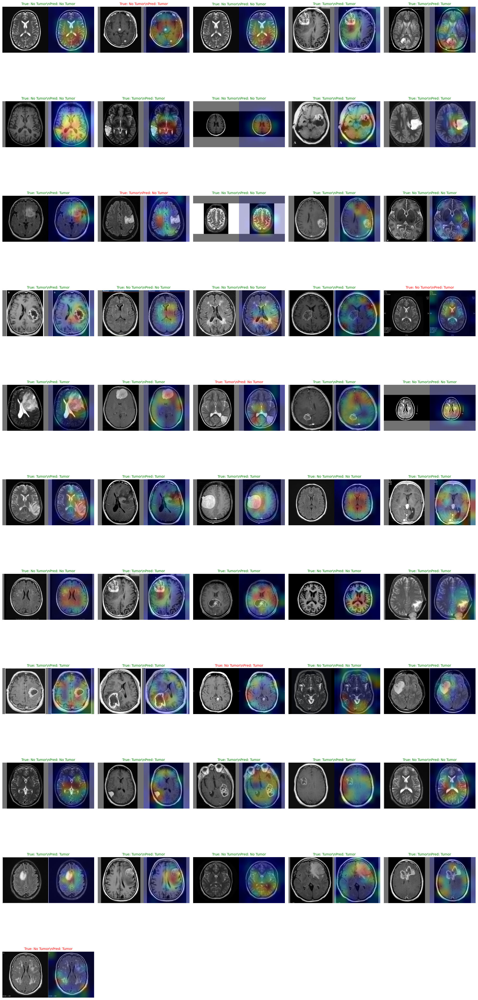

In [107]:
# Run a loop for resnet_model to display all the images and their predicted label.
if 'resnet_model' in locals() and 'test_data' in locals():
    num_images = len(test_data)
    cols = 5
    rows = math.ceil(num_images / cols)
    
    plt.figure(figsize=(20, 4 * rows))
    print(f"Visualizing Grad-CAM for all {num_images} test images...")
    
    for i in range(num_images):
        # Get raw image (BGR format from cv2)
        raw_img = test_data[i]
        
        # Preprocess for model
        img_for_model = raw_img.copy()
        img_for_model = np.expand_dims(img_for_model, axis=0)
        img_for_model = resnet_preprocess(img_for_model)
        
        # Generate heatmap
        heatmap = make_gradcam_heatmap(img_for_model, resnet_model, 'conv5_block3_out')
        
        # Prepare image for display (Convert BGR to RGB)
        disp_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
        
        # Get superimposed image
        result_img_pil = get_gradcam_image(disp_img, heatmap)
        result_img = np.array(result_img_pil)
        
        # Concatenate original image and Grad-CAM image horizontally
        combined_img = np.hstack((disp_img, result_img))
        
        # Plot
        ax = plt.subplot(rows, cols, i + 1)
        plt.imshow(combined_img)
        
        # Get prediction for title
        preds = resnet_model.predict(img_for_model, verbose=0)
        pred_label = 'Tumor' if preds[0][0] > 0.5 else 'No Tumor'
        true_label = 'Tumor' if test_labels[i] == 1 else 'No Tumor'
        
        # Color title based on correctness
        title_color = 'green' if pred_label == true_label else 'red'
        
        plt.title(f"True: {true_label}\\nPred: {pred_label}", color=title_color, fontsize=10)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("Please train the ResNet model (resnet_model) and load data (test_data) first.")


## Ensemble the Models

Ensemble learning is a powerful technique where you combine the predictions of multiple models to improve the overall performance and robustness. Since I have trained multiple models (VGG16, ResNet50, etc.), we can combine their predictions.

A common and effective ensemble method for classification is Averaging, where we take the average of the probability scores output by each model.

In [111]:
#let's make a function to get ensemble predictions
def get_ensemble_predictions(models_config, test_data):
    """
    Generates ensemble predictions by averaging the output probabilities of multiple models.
    Handles resizing if the model expects a different input shape.
    
    Args:
        models_config: List of tuples. Each tuple can be (model, preprocess_function) 
                       OR (model, layer_name, preprocess_function).
        test_data: The raw test image data (numpy array).
        
    Returns:
        Averaged predictions (probabilities).
    """
    print(f"Ensembling {len(models_config)} models...")
    
    # Initialize sum of predictions
    if len(test_data) == 0:
        return np.array([])
        
    summed_predictions = np.zeros((len(test_data), 1))
    
    for config_item in models_config:
        # Unpack based on length to handle both old (2-item) and new (3-item) configs
        if len(config_item) == 3:
            model, _layer_name, preprocess_func = config_item
        else: # Assumes 2 items
            model, preprocess_func = config_item

        # Check if model exists
        if model is None:
            continue
            
        print(f"Processing with model type: {type(model).__name__}")
        
        # Important: Create a copy of data to avoid in-place modification
        X_test_preprocessed = test_data.copy()
        
        # --- FIX: Check and Resize Input ---
        # Get expected input shape (H, W) from model
        # model.input_shape is typically (None, H, W, 3)
        if hasattr(model, 'input_shape'):
            model_input_shape = model.input_shape[1:3]
            data_input_shape = X_test_preprocessed.shape[1:3]
            
            if model_input_shape != data_input_shape:
                print(f"Resizing data from {data_input_shape} to {model_input_shape} for {model.name}...")
                # Resize using TensorFlow (handles batch efficiently)
                # Note: tf.image.resize returns float32 tensors
                X_test_preprocessed = tf.image.resize(X_test_preprocessed, model_input_shape).numpy()
        
        # Apply model-specific preprocessing
        if preprocess_func:
            X_test_preprocessed = preprocess_func(X_test_preprocessed)
        
        # Get predictions
        preds = model.predict(X_test_preprocessed, verbose=1)
        summed_predictions += preds
        
    # Average the predictions
    num_models = len([m for m, *_, p in models_config if m is not None])
    if num_models == 0:
        return np.array([])
        
    avg_predictions = summed_predictions / num_models
    return avg_predictions

# Configuration 
# Define the models to include in the ensemble.
# We pair each model with its specific preprocessing function.
ensemble_config = []

# Add VGG16 if it exists
if 'vgg_model' in locals():
    ensemble_config.append((vgg_model, vgg_preprocess))

# Add ResNet50 if it exists
if 'resnet_model' in locals():
    ensemble_config.append((resnet_model, resnet_preprocess))

if 'inception_model' in locals():
    # InceptionV3's last conv layer is typically 'mixed10'
    ensemble_config.append((inception_model, 'mixed10', inception_preprocess))

if 'eff_model' in locals():
    # EfficientNetB0's last conv layer is typically 'top_conv'
    ensemble_config.append((eff_model, 'top_conv', efficientnet_preprocess))
    
if 'mbl_model' in locals():
    # MobileNetV3Large's last conv layer is typically 'Conv_1'
    ensemble_config.append((mbl_model, 'Conv_1', mobilenet_preprocess))

Ensembling 5 models...
Processing with model type: Sequential
2/2 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step
Processing with model type: Sequential
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 804ms/step
Processing with model type: Sequential
Resizing data from (224, 224) to (299, 299) for sequential_7...
2/2 ━━━━━━━━━━━━━━━━━━━━ 7s 3s/step
Processing with model type: Sequential
2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step
Processing with model type: Sequential
2/2 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step

--- Ensemble Model Evaluation ---
Ensemble Accuracy: 0.8235

Confusion Matrix:
[[16  4]
 [ 5 26]]

Classification Report:
              precision    recall  f1-score   support

    No Tumor       0.76      0.80      0.78        20
       Tumor       0.87      0.84      0.85        31

    accuracy                           0.82        51
   macro avg       0.81      0.82      0.82        51
weighted avg       0.83      0.82      0.82        51



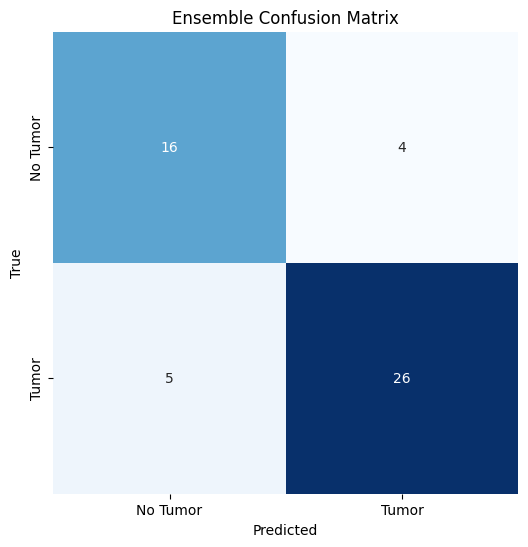

In [112]:
# Execution 
if ensemble_config:
    # Get ensemble predictions
    ensemble_preds = get_ensemble_predictions(ensemble_config, test_data)
    
    # Convert probabilities to class labels (Threshold 0.5)
    ensemble_class_preds = (ensemble_preds > 0.5).astype(int)
    
    # Evaluation
    print("\n--- Ensemble Model Evaluation ---")
    ens_acc = accuracy_score(test_labels, ensemble_class_preds)
    print(f"Ensemble Accuracy: {ens_acc:.4f}")
    
    print("\nConfusion Matrix:")
    cm_ens = confusion_matrix(test_labels, ensemble_class_preds)
    print(cm_ens)
    
    print("\nClassification Report:")
    print(classification_report(test_labels, ensemble_class_preds, target_names=['No Tumor', 'Tumor']))
    
    # Plot Confusion Matrix
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm_ens, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['No Tumor', 'Tumor'],
                yticklabels=['No Tumor', 'Tumor'])
    plt.title('Ensemble Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()
else:
    print("No models found for ensemble. Please ensure Models are trained and in memory.")


In [115]:
#let's make a function to get ensemble grad-cam heatmaps
def make_ensemble_gradcam_heatmap(img_array, models_info):
    """
    Generates an averaged Grad-CAM heatmap from multiple models.
    
    Args:
        img_array: Input image array (1, 224, 224, 3).
        models_info: List of tuples (model, last_conv_layer_name, preprocess_func).
        
    Returns:
        Averaged heatmap (numpy array).
    """
    heatmaps = []
    target_size = img_array.shape[1:3] # Get target size (e.g., 224, 224) from input
    
    for model, layer_name, preprocess_func in models_info:
        if model is None:
            continue
            
        # 1. Preprocess input specifically for this model
        model_input = img_array.copy()
        if preprocess_func:
            model_input = preprocess_func(model_input)
            
        # 2. Generate heatmap using your existing function
        try:
            heatmap = make_gradcam_heatmap(model_input, model, layer_name)
            # FIX: Resize heatmap to a common size before averaging
            heatmap = cv2.resize(heatmap, (target_size[1], target_size[0]))
            heatmaps.append(heatmap)
        except Exception as e:
            print(f"Skipping model {model.name} due to error: {e}")
            
    if not heatmaps:
        return np.zeros(img_array.shape[1:3])
        
    # 3. Average the heatmaps (now they are all the same size)
    avg_heatmap = np.mean(heatmaps, axis=0)
    
    # 4. Normalize the final averaged heatmap
    if np.max(avg_heatmap) > 0:
        avg_heatmap = np.maximum(avg_heatmap, 0) / np.max(avg_heatmap)
    
    return avg_heatmap

# Configuration
# Define the models to include in the Ensemble Grad-CAM
# Format: (Model Object, Last Conv Layer Name, Preprocessing Function)
ensemble_gradcam_config = []

if 'vgg_model' in locals():
    ensemble_gradcam_config.append((vgg_model, 'block5_conv3', vgg_preprocess))

if 'resnet_model' in locals():
    # ResNet50's last conv layer is typically 'conv5_block3_out'
    ensemble_gradcam_config.append((resnet_model, 'conv5_block3_out', resnet_preprocess))
# if 'inception_model' in locals():
#     # InceptionV3's last conv layer is typically 'mixed10'
#     ensemble_gradcam_config.append((inception_model, 'mixed10', inception_preprocess))
if 'eff_model' in locals():
    # EfficientNetB0's last conv layer is typically 'top_conv'
    ensemble_gradcam_config.append((eff_model, 'top_conv', efficientnet_preprocess))
if 'mbl_model' in locals():
    # MobileNetV3Large's last conv layer is typically 'Conv_1'
    ensemble_gradcam_config.append((mbl_model, 'Conv_1', mobilenet_preprocess))

Visualizing Ensemble Grad-CAM for all 51 test images...
Skipping model sequential_9 due to error: No such layer: Conv_1. Existing layers are: ['input_layer_226', 'rescaling_5', 'conv', 'conv_bn', 'activation_208', 'expanded_conv_depthwise', 'expanded_conv_depthwise_bn', 're_lu_19', 'expanded_conv_project', 'expanded_conv_project_bn', 'expanded_conv_add', 'expanded_conv_1_expand', 'expanded_conv_1_expand_bn', 're_lu_20', 'expanded_conv_1_depthwise_pad', 'expanded_conv_1_depthwise', 'expanded_conv_1_depthwise_bn', 're_lu_21', 'expanded_conv_1_project', 'expanded_conv_1_project_bn', 'expanded_conv_2_expand', 'expanded_conv_2_expand_bn', 're_lu_22', 'expanded_conv_2_depthwise', 'expanded_conv_2_depthwise_bn', 're_lu_23', 'expanded_conv_2_project', 'expanded_conv_2_project_bn', 'expanded_conv_2_add', 'expanded_conv_3_expand', 'expanded_conv_3_expand_bn', 're_lu_24', 'expanded_conv_3_depthwise_pad', 'expanded_conv_3_depthwise', 'expanded_conv_3_depthwise_bn', 're_lu_25', 'expanded_conv_3_squ

C:\Users\Infinity\AppData\Local\Temp\ipykernel_15876\3984415613.py:61: RuntimeWarning:

invalid value encountered in cast



Skipping model sequential_9 due to error: No such layer: Conv_1. Existing layers are: ['input_layer_226', 'rescaling_5', 'conv', 'conv_bn', 'activation_208', 'expanded_conv_depthwise', 'expanded_conv_depthwise_bn', 're_lu_19', 'expanded_conv_project', 'expanded_conv_project_bn', 'expanded_conv_add', 'expanded_conv_1_expand', 'expanded_conv_1_expand_bn', 're_lu_20', 'expanded_conv_1_depthwise_pad', 'expanded_conv_1_depthwise', 'expanded_conv_1_depthwise_bn', 're_lu_21', 'expanded_conv_1_project', 'expanded_conv_1_project_bn', 'expanded_conv_2_expand', 'expanded_conv_2_expand_bn', 're_lu_22', 'expanded_conv_2_depthwise', 'expanded_conv_2_depthwise_bn', 're_lu_23', 'expanded_conv_2_project', 'expanded_conv_2_project_bn', 'expanded_conv_2_add', 'expanded_conv_3_expand', 'expanded_conv_3_expand_bn', 're_lu_24', 'expanded_conv_3_depthwise_pad', 'expanded_conv_3_depthwise', 'expanded_conv_3_depthwise_bn', 're_lu_25', 'expanded_conv_3_squeeze_excite_avg_pool', 'expanded_conv_3_squeeze_excite_c

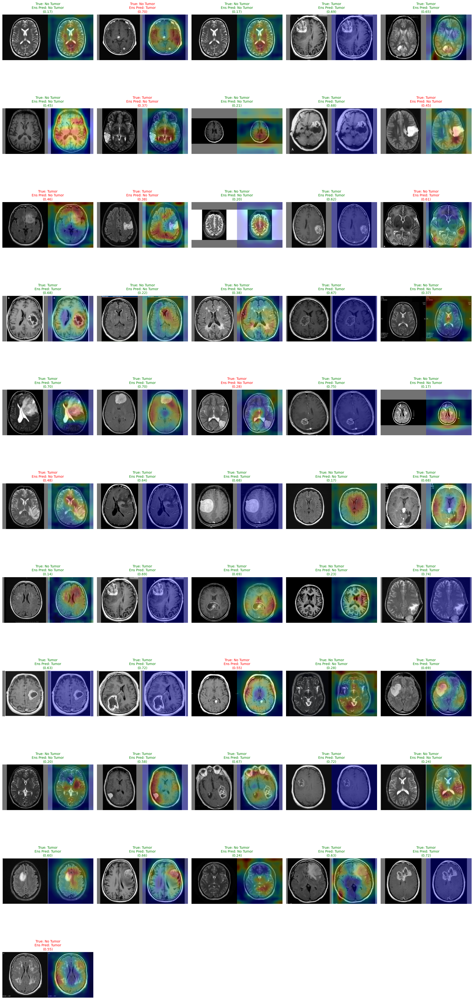

In [116]:
# --- Visualization Loop ---
if ensemble_gradcam_config and 'test_data' in locals():
    num_images = len(test_data)
    cols = 5
    rows = math.ceil(num_images / cols)
    
    plt.figure(figsize=(20, 4 * rows))
    print(f"Visualizing Ensemble Grad-CAM for all {num_images} test images...")
    
    for i in range(num_images):
        # Get raw image
        raw_img = test_data[i]
        # Expand dims for model input (1, 224, 224, 3)
        img_for_model = np.expand_dims(raw_img, axis=0)
        
        # 1. Generate Averaged Ensemble Heatmap
        heatmap = make_ensemble_gradcam_heatmap(img_for_model, ensemble_gradcam_config)
        
        # 2. Prepare image for display
        disp_img = cv2.cvtColor(raw_img, cv2.COLOR_BGR2RGB)
        
        # 3. Create Superimposed Image
        result_img_pil = get_gradcam_image(disp_img, heatmap)
        result_img = np.array(result_img_pil)
        
        # 4. Concatenate Original + Heatmap
        combined_img = np.hstack((disp_img, result_img))
        
        # 5. Calculate Ensemble Prediction (Average of probabilities)
        total_pred = 0
        valid_models = 0
        for model, _, preprocess_func in ensemble_gradcam_config:
            model_input = img_for_model.copy()
            if preprocess_func:
                model_input = preprocess_func(model_input)
            
            # Predict
            pred = model.predict(model_input, verbose=0)[0][0]
            total_pred += pred
            valid_models += 1
            
        avg_pred = total_pred / valid_models if valid_models > 0 else 0
        
        # Determine labels
        pred_label = 'Tumor' if avg_pred > 0.5 else 'No Tumor'
        true_label = 'Tumor' if test_labels[i] == 1 else 'No Tumor'
        
        # Plot
        ax = plt.subplot(rows, cols, i + 1)
        plt.imshow(combined_img)
        
        title_color = 'green' if pred_label == true_label else 'red'
        plt.title(f"True: {true_label}\nEns Pred: {pred_label}\n({avg_pred:.2f})", color=title_color, fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Please ensure vgg_model and resnet_model are trained and test_data is loaded.")
